Segmentation main

lung X-rays segmentation by UNet model

Link to Google drive and set up working directory

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
path="/content/drive/MyDrive/Colab Notebooks/BIA4_Group7"
os.chdir(path)
os.listdir(path)

['TB_Chest_Radiography_Database',
 'test1.py',
 'data_preparation.py',
 'processed_images.zip',
 'augmented_images.zip',
 'unet_model.py',
 '1000_external_data',
 '200_test_external',
 '200_val_external',
 'data_prepare_main.ipynb',
 'datasetprocessing.py',
 '__pycache__',
 '.ipynb_checkpoints',
 'segmentation',
 'processed_images',
 'augmented_images',
 'test',
 'unet_model.pth',
 'validation.py',
 'train.py',
 'segmented_images',
 'segmented_images.zip',
 'background_image.jpg',
 'GUI.py',
 'segment_lung_xrays_to_GUI.py',
 'resnet_train.py',
 'Dataset.py',
 'resnet_model.py',
 'classification_data',
 'main.py',
 'segmentation_main.ipynb']

Run the unet_train.py to train the model and get training losses and training accuracies.

In [ ]:
!python unet_train.py

/content/drive/MyDrive/Colab Notebooks/BIA4_Group7/train.py:51: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  structure = np.ones((3, 3), dtype=np.int)
/content/drive/MyDrive/Colab Notebooks/BIA4_Group7/train.py:60: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/r

Load our model.

In [ ]:
import torch
import numpy as np
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(n_channels=1, n_classes=1)
model.load_state_dict(torch.load('unet_model.pth'))
model.to(device)

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

Run the unet_validation.py to implement model validation.

In [ ]:
!python unet_validation.py

/content/drive/MyDrive/Colab Notebooks/BIA4_Group7/validation.py:33: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  structure = np.ones((3, 3), dtype=np.int)
/content/drive/MyDrive/Colab Notebooks/BIA4_Group7/validation.py:42: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org

Compare the loss  and accuracy of model training and model validation by graph.

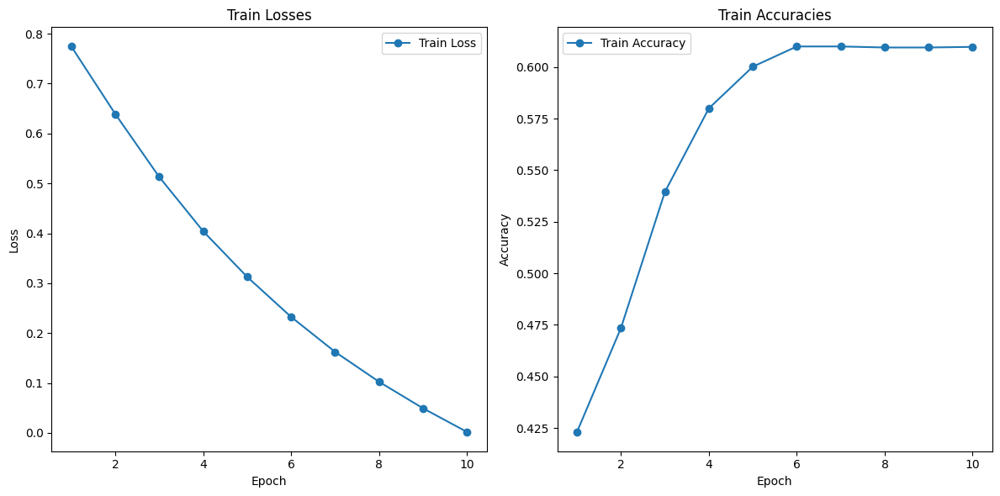

In [2]:
#Training model outputs:
# Epoch 1/10, Training Loss: 0.7744, Training Acc: 0.4231
# Epoch 2/10, Training Loss: 0.6391, Training Acc: 0.4735
# Epoch 3/10, Training Loss: 0.5129, Training Acc: 0.5395
# Epoch 4/10, Training Loss: 0.4041, Training Acc: 0.5800
# Epoch 5/10, Training Loss: 0.3127, Training Acc: 0.6002
# Epoch 6/10, Training Loss: 0.2325, Training Acc: 0.6100
# Epoch 7/10, Training Loss: 0.1624, Training Acc: 0.6100
# Epoch 8/10, Training Loss: 0.1025, Training Acc: 0.6095
# Epoch 9/10, Training Loss: 0.0494, Training Acc: 0.6095
# Epoch 10/10, Training Loss: 0.0020, Training Acc: 0.6098
#train_losses and train_accuracies from epoch 1 to epoch 10
train_losses=[0.7744,0.6391,0.5129,0.4041,0.3127,0.2325,0.1624,0.1025,0.0494,0.0020]

train_accuracies=[0.4231,0.4735,0.5395,0.5800,0.6002,0.6100,0.6100,0.6095,0.6095,0.6098]


import matplotlib.pyplot as plt

# x-axis epoch 1-10
epochs = list(range(1, 11))

# Plot losses (compare train and validation loss)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train Losses')
plt.legend()

# Plot accuracies (compare train and validation accuracies)
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Train Accuracy', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train Accuracies')
plt.legend()

plt.tight_layout()
plt.show()

Calculate IOU of our segmented model.

In [ ]:
import numpy as np
import torch
import numpy as np
from torch.utils.data import DataLoader

#parameter setting
EPOCHS = 10
LEARNING_RATE = 1e-3
BATCH_SIZE = 40

# load data
#Reminder: You need to change the following file path to the true path in your computer.
transform = get_transform()
test_dataset = XRayDataset(image_dir='../data/200_test_external/image',
                           mask_dir='../data/200_test_external/mask',
                           transform=transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

def calculate_iou(preds, true_masks):
    # Convert the prediction and true mask into binary image data (only 0 or 1)
    preds_bin = (preds > 0.5).float()
    masks_bin = (true_masks > 0.5).float()

    # intersection
    intersection = np.sum(masks_bin.cpu().numpy() * preds_bin.cpu().numpy())
    # union
    union = np.sum(masks_bin.cpu().numpy() == 1)
    # IoU
    iou = (intersection + 1e-6) / (union + 1e-6)  # 1e-6 is to avoid zeros in the denominator

    return iou.mean()

# Validation Loop
iou_list = []
model.eval()
with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)
        output = model(images)
        output_prob = torch.sigmoid(output)
        iou_score = calculate_iou(output_prob, masks)
        iou_list.append(iou_score.item())

# calculate the average IoU of all batches
average_iou = sum(iou_list) / len(iou_list)
print(f"Average IoU Score: {average_iou}")


#Output:
#Average IoU Score: 0.9548176625887942

Average IoU Score: 0.9548176625887942


visualization

1.Show comparison of original images, true masks, predicted masks

2.show original images, true masks, predicted masks and overlay of true masks and predicted masks

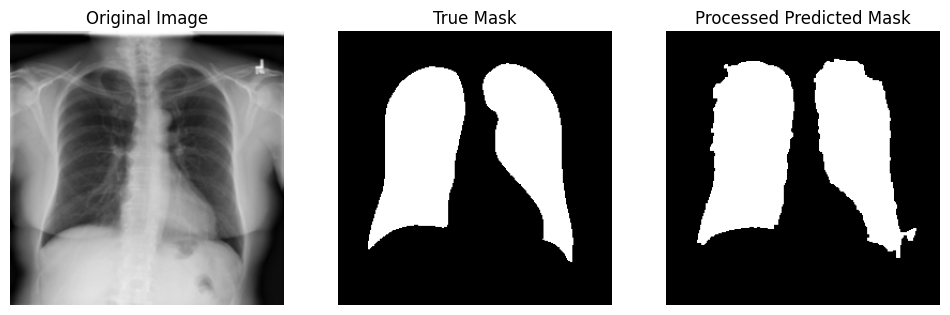

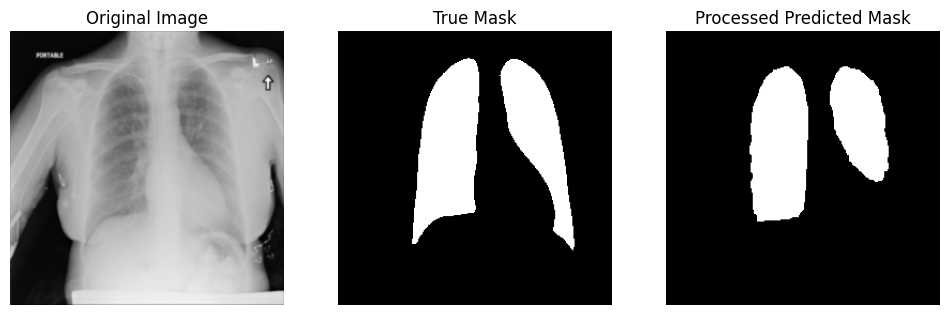

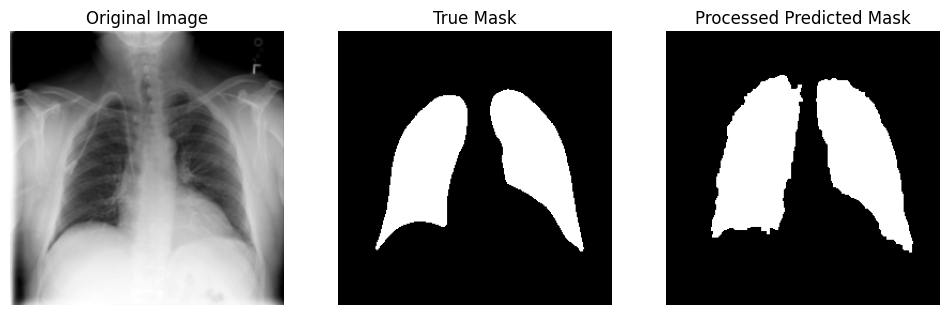

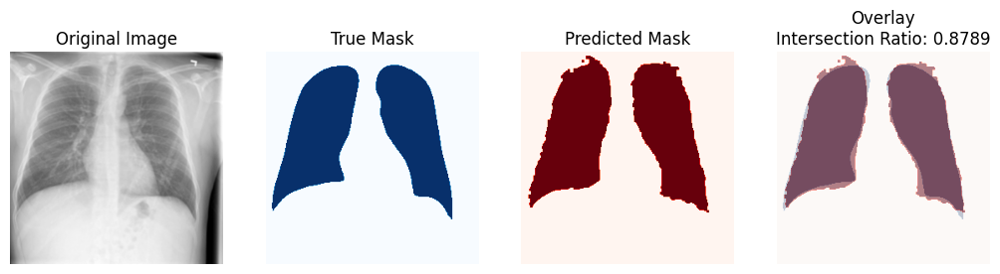

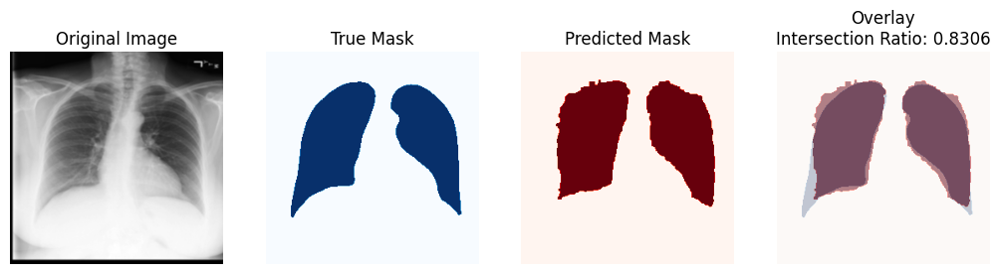

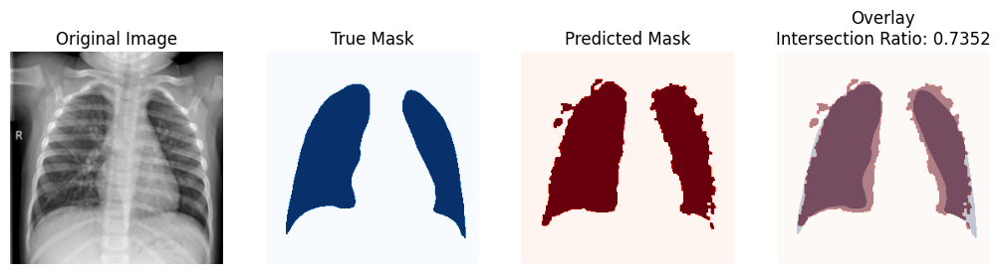

In [ ]:
import torch
from torch.utils.data import DataLoader
import numpy as np
from unet_model import UNet
from unet_dataset import XRayDataset, get_transform
import matplotlib.pyplot as plt
from scipy.ndimage import label, binary_opening, binary_closing, generate_binary_structure

# Load our model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(n_channels=1, n_classes=1)
# 'map_location=torch.device('cpu')': This is to ensure that "CPU" can be used even if your computer does not support "CUDA".
# Reminder: You need to change the following file path to the true path in your computer.
model.load_state_dict(torch.load('unet_model.pth'))
model.to(device)

BATCH_SIZE = 40  #set batch size
transform = get_transform()
# Reminder: You need to change the following file path to the true path in your computer.
val_dataset = XRayDataset(image_dir='../data/200_val_external/image',
                          mask_dir='../data/200_val_external/mask',
                          transform=transform)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)



def keep_largest_regions(mask, n_largest=2):
    '''
    Defined function to only retain the two largest connected white areas in the mask (i.e., the two lung areas)
    '''
    # Ensure the mask is 2D format
    if mask.ndim > 2:
        mask = mask.squeeze()
    structure = np.ones((3, 3), dtype=np.int)
    labeled, ncomponents = label(mask, structure)
    unique, counts = np.unique(labeled, return_counts=True)

    # Find the indices (location) of the largest components
    largest_components = unique[np.argsort(-counts)][:n_largest + 1]  # +1 because background is labeled as 0

    # # only remain the top 2 largest components and remove others
    filtered_mask = np.isin(labeled, largest_components[1:])  # Exclude background with index 0
    return filtered_mask.astype(np.float)


def smooth_lung_mask(mask, structure_size=8):
    '''
    Smooth the lung mask, using binary opening and closing to remove small holes or small irregular edges in the mask,
    to make the mask more continuous and consistent
    '''
    # Create a structural element
    binary_structure = generate_binary_structure(2, structure_size)

    # Apply binary opening and binary closing to smooth the mask
    mask_opened = binary_opening(mask, structure=binary_structure)
    mask_smoothed = binary_closing(mask_opened, structure=binary_structure)

    return mask_smoothed.astype(np.float64)



def visualize_model(model, data_loader, num_examples=5):
    '''
    Show comparison of original images, true masks, predicted masks
    '''
    model.eval() # make sure model in evaluation part
    images_shown = 0
    with torch.no_grad():
        for images, masks in data_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            outputs = torch.sigmoid(outputs) > 0.5

            for i in range(images.size(0)):
                if images_shown >= num_examples:
                    return

                processed_output = keep_largest_regions(outputs[i].cpu().numpy(), n_largest=2)
                processed_output = smooth_lung_mask(processed_output,structure_size=2)

                # Define the figsize
                plt.figure(figsize=(12, 4))
                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(images[i].cpu().squeeze(), cmap='gray')
                plt.title('Original Image')
                plt.axis('off')

                # True Mask
                plt.subplot(1, 3, 2)
                plt.imshow(masks[i].cpu().squeeze(), cmap='gray')
                plt.title('True Mask')
                plt.axis('off')

                # Predicted Mask after processing
                plt.subplot(1, 3, 3)
                plt.imshow(processed_output, cmap='gray')
                plt.title('Processed Predicted Mask')
                plt.axis('off')

                plt.show()
                images_shown += 1 #count the image shown


def visualization_overleaf(model, data_loader, num_examples=5):
    '''
    #define function to show original images, true masks, predicted masks and overlay of true masks and predicted masks
    '''
    model.eval() # make sure model in evaluation part
    images_shown = 0

    with torch.no_grad():
        for images, masks in data_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            outputs = torch.sigmoid(outputs) > 0.5

            for i in range(images.size(0)):
                if images_shown >= num_examples:
                    return

                processed_output = keep_largest_regions(outputs[i].cpu().numpy(), n_largest=2)
                processed_output = smooth_lung_mask(processed_output, structure_size=2)

                # Calculate the Intersection Ratio
                intersection_ratio = np.sum(masks[i].cpu().numpy() * processed_output) / np.sum(masks[i].cpu().numpy() == 1)

                # define the figsize
                plt.figure(figsize=(16, 4))
                # show Original Image
                plt.subplot(1, 5, 1)
                plt.imshow(images[i].cpu().squeeze(), cmap='gray')
                plt.title('Original Image')
                plt.axis('off')

                # show True Mask
                plt.subplot(1, 5, 2)
                plt.imshow(masks[i].cpu().squeeze(), cmap='Blues')
                plt.title('True Mask')
                plt.axis('off')

                # show Predicted Mask
                plt.subplot(1, 5, 3)
                plt.imshow(processed_output, cmap='Reds')
                plt.title('Predicted Mask')
                plt.axis('off')

                # Overlay of True and Predicted Mask with Intersection Ratio
                plt.subplot(1, 5, 4)
                plt.imshow(masks[i].cpu().squeeze(), cmap='Blues', alpha=0.5)
                plt.imshow(processed_output, cmap='Reds', alpha=0.5)
                plt.title('Overlay\nIntersection Ratio: {:.4f}'.format(intersection_ratio))
                plt.axis('off')

                plt.show()
                images_shown += 1


# Call the function
visualize_model(model, val_loader)
visualization_overleaf(model, val_loader)


Process reference data images (3500 normal +700tb) using our unet model, and obtain and obtain their lung segmentation images (masks).

<ipython-input-9-78796bfb3c5b>:25: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  structure = np.ones((3, 3), dtype=np.int)
<ipython-input-9-78796bfb3c5b>:34: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return filtered_ma

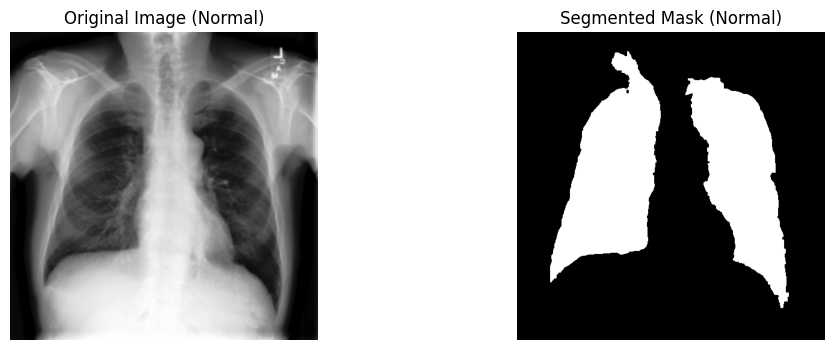

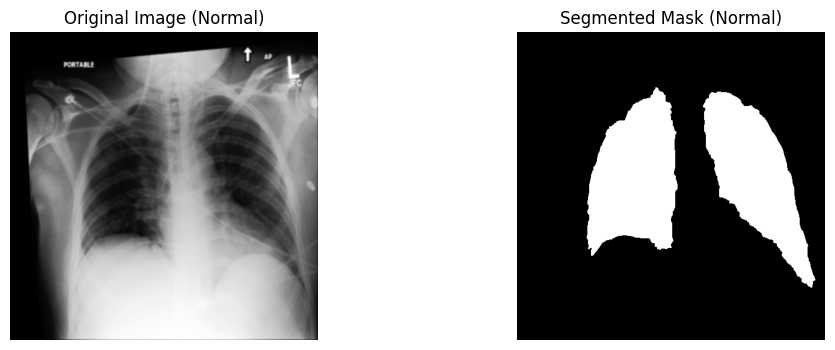

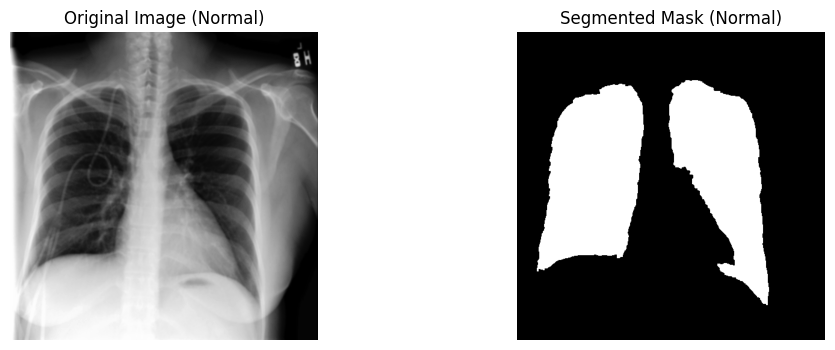

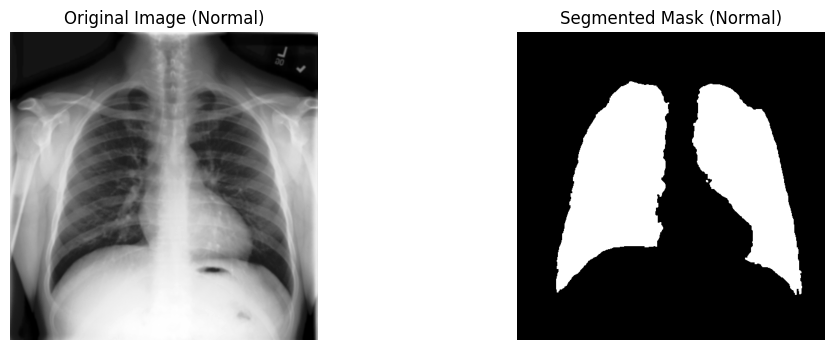

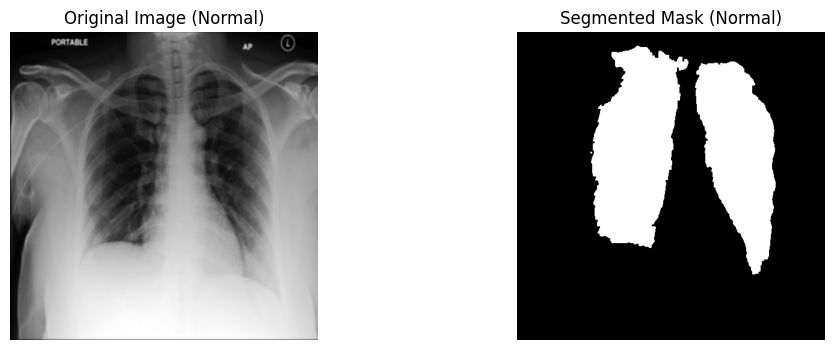

...

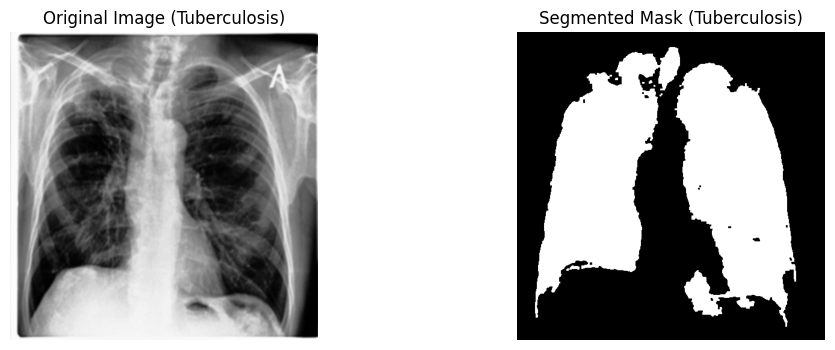

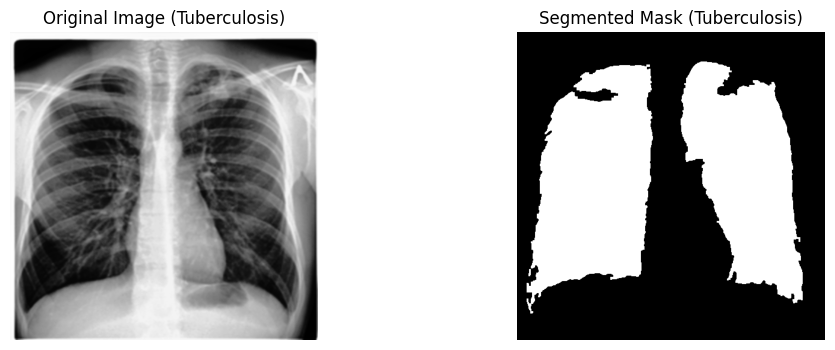

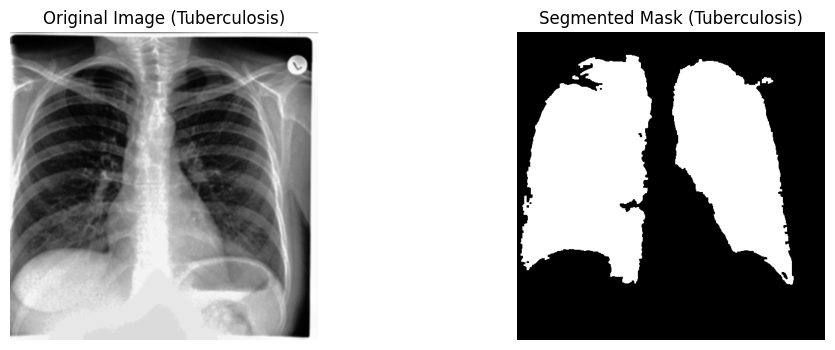

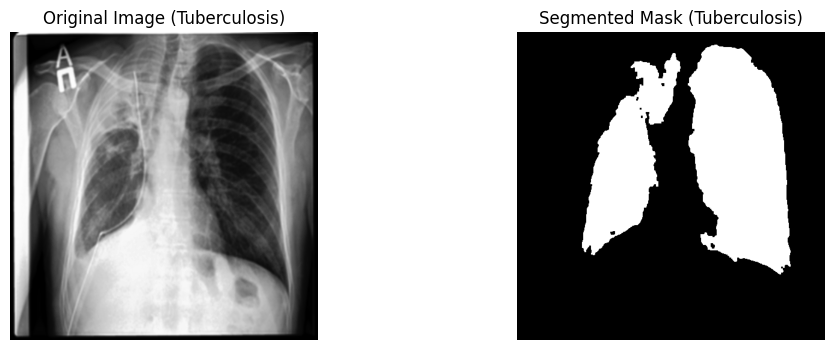

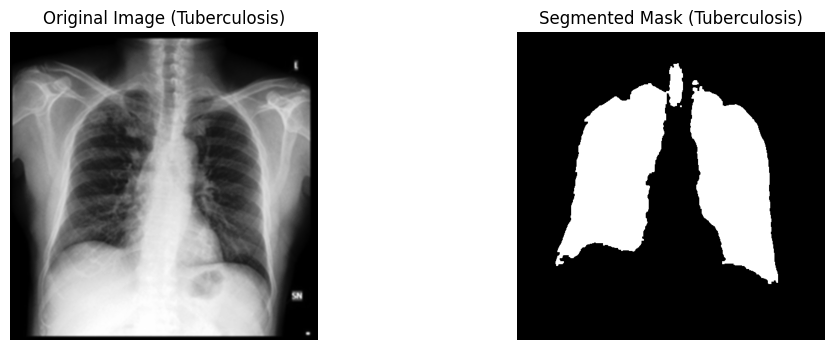

In [ ]:
import os
import numpy as np
import torch
from PIL import Image, ImageOps, ImageEnhance
from torchvision import transforms
from torch.utils.data import DataLoader
from unet_dataset import XRayDataset,get_transform
from unet_model import UNet
from torchvision.utils import save_image
import matplotlib.pyplot as plt
from scipy.ndimage import label, binary_opening, binary_closing, generate_binary_structure

# Load our model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")#Prioritize using GPU to run code
model = UNet(n_channels=1, n_classes=1).to(device)#Use the learned U-Net model to process images

model.load_state_dict(torch.load('unet_model.pth'))
# model.load_state_dict(torch.load('unet_model.pth'),map_location=torch.device('cpu'))
# 'map_location=torch.device('cpu')': This is to ensure that "CPU" can be used even if your computer does not support "CUDA".
model.eval()

#Set working path
normal_image_dir = '../data/processed_images/normal'
normal_output_dir = '../data/segmented_images/normal_masks'

tb_image_dir = '../data/processed_images/tb'
tb_output_dir = '../data/segmented_images/tb_masks'



def keep_largest_regions(mask, n_largest=2):
    '''
    The function defined keeps only the two largest connected white areas in the mask (i.e. the two lung areas)
    '''
    # Ensure the mask is 2D format
    if mask.ndim > 2:
        mask = mask.squeeze()
    structure = np.ones((3, 3), dtype=np.int)# Create a structuring element of shape (3, 3) for morphological labeling.
    labeled, ncomponents = label(mask, structure)
    unique, counts = np.unique(labeled, return_counts=True)

    # Find the location of the largest components
    largest_components = unique[np.argsort(-counts)][:n_largest + 1]  # background is usually labeled as 0, so here +1 is necessary

    # only remain the top 2 largest components and remove others
    filtered_mask = np.isin(labeled, largest_components[1:])  # Exclude background with index 0
    return filtered_mask.astype(np.float)


def smooth_lung_mask(mask, structure_size=8):
    '''
    Smooth the lung mask, using binary opening and closing to remove small holes or small irregular edges in the mask,
    to make the mask more continuous and consistent
    '''
    # Create a 2D structural element
    binary_structure = generate_binary_structure(2, structure_size)

    # Apply binary opening and binary closing.
    mask_opened = binary_opening(mask, structure=binary_structure)
    mask_smoothed = binary_closing(mask_opened, structure=binary_structure)
    # This can make the image smoother and make the image features more prominent.

    return mask_smoothed.astype(np.float64)


def segment_and_save_image(image_path, output_dir, model, device, transform, show_image=False):
    """
    Segment lung X-ray image and save the segmented mask.
    """
    # Open the image file
    image = Image.open(image_path).convert('L')  # Convert the image to grayscale
    image_tensor = transform(image).unsqueeze(0).to(device)  # Transform to tensor and add batch dimension

    #Output results based on the model.
    with torch.no_grad():
        output = model(image_tensor)
        output_prob = torch.sigmoid(output)
        output_binary = (output_prob > 0.5).float()
        output_np = output_binary.cpu().numpy().squeeze()


        segmented_mask = keep_largest_regions(output_np, n_largest=2)
        # Process the mask output from the model to ensure that the two largest connected areas are left.
        segmented_mask = smooth_lung_mask(segmented_mask ,structure_size=2)
        # Smoothing these two areas has resulted in a more accurate mask model.

    # Extract the prefix from the image file name
    image_prefix = os.path.splitext(image_file)[0].split('-')[0]

    # Show the images
    if show_image:
        fig, ax = plt.subplots(1, 2, figsize=(12, 4))
        ax[0].imshow(image, cmap='gray')
        ax[0].set_title(f'Original Image ({image_prefix})')  # Use new title to distinguish easily
        ax[0].axis('off')

        ax[1].imshow(segmented_mask, cmap='gray')
        ax[1].set_title(f'Segmented Mask ({image_prefix})')  # Use new title to distinguish easily
        ax[1].axis('off')

        plt.show()

    # Save the processed image
    save_image(segmented_mask, output_dir, f'Segmented_{os.path.basename(image_path)}')
    if show_image:
        plt.close(fig)  # Close the plot to free up memory

def save_image(segmented_mask, output_dir, output_file_name):
    """
    Save the segmented mask to the specific directory.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)  # Create the directory if it does not exist
    output_path = os.path.join(output_dir, output_file_name)# Form a complete output path.
    plt.imsave(output_path, segmented_mask, cmap='gray')




#Convert the image to a PyTorch Tensor and normalize the operation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

#Normal
### Segment and save images in each directory.
segmented_normal_image_paths = []  # Store the processed image path
for image_file in os.listdir(normal_image_dir):
    image_path = os.path.join(normal_image_dir, image_file)
    segment_and_save_image(image_path, normal_output_dir, model, device, transform, show_image=False)
    segmented_normal_image_paths.append(image_path)  # input the processed image path into a list
### Display a subset of processed images
max_images_to_show = 50   #Select 50 pictures for display.
for i, image_path in enumerate(segmented_normal_image_paths):
    if i < max_images_to_show:
        image = Image.open(image_path)
        segment_and_save_image(image_path, normal_output_dir, model, device, transform, show_image=True)
    else:
        break
#Processed and saved each noraml images. The loop stops after the maximum number of displays is reached.
#tb
### segment and save images
segmented_tb_image_paths = []  # Store the processed image path
for image_file in os.listdir(tb_image_dir):
    image_path = os.path.join(tb_image_dir, image_file)
    segment_and_save_image(image_path, tb_output_dir, model, device, transform, show_image=False)
    segmented_tb_image_paths.append(image_path)  # input the processed image path into a list
### Display a subset of processed images
max_images_to_show = 50  #Select 50 pictures for display.
for i, image_path in enumerate(segmented_tb_image_paths):
    if i < max_images_to_show:
        image = Image.open(image_path)
        segment_and_save_image(image_path, tb_output_dir, model, device, transform, show_image=True)
    else:
        break
#Processed and saved each tb images. The loop stops after the maximum number of displays is reached.

Check the availability of CUDA (GPU).

In [ ]:
print(torch.cuda.is_available())

True


Zip all the segmented images (masks).

In [ ]:
import shutil
shutil.make_archive('segmented_images', 'zip', '/content/drive/MyDrive/Colab Notebooks/BIA4_Group7/segmented_images')

'/content/segmented_images.zip'